# <center> Optimizing an Advertising Campaign by Location Intelligence.</center>

### Import libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import datetime
sns.set()
import geopandas as gpd

!conda install -c conda-forge folium=0.5.0 --yes
import folium

print('Folium installed and imported!')

Solving environment: ...working... done

# All requested packages already installed.

Folium installed and imported!


### Download data. Create Dataframe. Overview the data

In [2]:
yellow_data = pd.read_csv('https://nyc-tlc.s3.amazonaws.com/trip+data/yellow_tripdata_2019-12.csv')
yellow_data.head()

C:\Users\te02881\AppData\Local\Continuum\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3049: DtypeWarning: Columns (6) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge
0,1.0,2019-12-01 00:26:58,2019-12-01 00:41:45,1.0,4.2,1.0,N,142,116,2.0,14.5,3.0,0.5,0.0,0.0,0.3,18.3,2.5
1,1.0,2019-12-01 00:12:08,2019-12-01 00:12:14,1.0,0.0,1.0,N,145,145,2.0,2.5,0.5,0.5,0.0,0.0,0.3,3.8,0.0
2,1.0,2019-12-01 00:25:53,2019-12-01 00:26:04,1.0,0.0,1.0,N,145,145,2.0,2.5,0.5,0.5,0.0,0.0,0.3,3.8,0.0
3,1.0,2019-12-01 00:12:03,2019-12-01 00:33:19,2.0,9.4,1.0,N,138,25,1.0,28.5,0.5,0.5,10.0,0.0,0.3,39.8,0.0
4,1.0,2019-12-01 00:05:27,2019-12-01 00:16:32,2.0,1.6,1.0,N,161,237,2.0,9.0,3.0,0.5,0.0,0.0,0.3,12.8,2.5


In [3]:
yellow_data.shape

(6896317, 18)

In [4]:
yellow_data.dtypes

VendorID                 float64
tpep_pickup_datetime      object
tpep_dropoff_datetime     object
passenger_count          float64
trip_distance            float64
RatecodeID               float64
store_and_fwd_flag        object
PULocationID               int64
DOLocationID               int64
payment_type             float64
fare_amount              float64
extra                    float64
mta_tax                  float64
tip_amount               float64
tolls_amount             float64
improvement_surcharge    float64
total_amount             float64
congestion_surcharge     float64
dtype: object

In [5]:
yellow_data.describe()

,VendorID,passenger_count,trip_distance,RatecodeID,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge
count,6.845299e+06,6.845299e+06,6.896317e+06,6.845299e+06,6.896317e+06,6.896317e+06,6.845299e+06,6.896317e+06,6.896317e+06,6.896317e+06,6.896317e+06,6.896317e+06,6.896317e+06,6.896317e+06,6.896317e+06
mean,1.666457e+00,1.550877e+00,2.973421e+00,1.065756e+00,1.636525e+02,1.614892e+02,1.298993e+00,1.359027e+01,1.108518e+00,4.924147e-01,2.244620e+00,3.881238e-01,2.979857e-01,1.964165e+01,2.275278e+00
std,4.714787e-01,1.174330e+00,1.643113e+01,9.309869e-01,6.605758e+01,7.033753e+01,4.879401e-01,1.522692e+02,1.259892e+00,7.233857e-02,2.875127e+00,1.715502e+00,3.381444e-02,1.525236e+02,7.359669e-01
min,1.000000e+00,0.000000e+00,-3.726453e+04,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,-1.472000e+03,-4.500000e+00,-5.000000e-01,-2.008000e+02,-4.050000e+01,-3.000000e-01,-1.472800e+03,-2.500000e+00
25%,1.000000e+00,1.000000e+00,9.600000e-01,1.000000e+00,1.250000e+02,1.120000e+02,1.000000e+00,6.500000e+00,0.000000e+00,5.000000e-01,0.000000e+00,0.000000e+00,3.000000e-01,1.130000e+01,2.500000e+00
50%,2.000000e+00,1.000000e+00,1.600000e+00,1.000000e+00,1.620000e+02,1.620000e+02,1.000000e+00,9.500000e+00,5.000000e-01,5.000000e-01,1.920000e+00,0.000000e+00,3.000000e-01,1.480000e+01,2.500000e+00
75%,2.000000e+00,2.000000e+00,3.030000e+00,1.000000e+00,2.330000e+02,2.340000e+02,2.000000e+00,1.543000e+01,2.500000e+00,5.000000e-01,3.000000e+00,0.000000e+00,3.000000e-01,2.135000e+01,2.500000e+00
max,2.000000e+00,9.000000e+00,1.913018e+04,9.900000e+01,2.650000e+02,2.650000e+02,5.000000e+00,3.984684e+05,9.006000e+01,3.300000e+00,4.044400e+02,6.126600e+02,3.000000e-01,3.984712e+05,3.000000e+00


In [6]:
green_data = pd.read_csv('https://nyc-tlc.s3.amazonaws.com/trip+data/green_tripdata_2019-12.csv')
green_data.head()

C:\Users\te02881\AppData\Local\Continuum\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3049: DtypeWarning: Columns (3) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


,VendorID,lpep_pickup_datetime,lpep_dropoff_datetime,store_and_fwd_flag,RatecodeID,PULocationID,DOLocationID,passenger_count,trip_distance,fare_amount,extra,mta_tax,tip_amount,tolls_amount,ehail_fee,improvement_surcharge,total_amount,payment_type,trip_type,congestion_surcharge
0,1.0,2019-12-01 00:09:45,2019-12-01 00:10:59,N,1.0,145,145,1.0,0.00,3.0,0.5,0.5,0.00,0.0,NaN,0.3,4.30,2.0,1.0,0.0
1,2.0,2019-12-01 00:26:05,2019-12-01 00:31:30,N,1.0,24,41,1.0,0.67,5.5,0.5,0.5,2.04,0.0,NaN,0.3,8.84,1.0,1.0,0.0
2,2.0,2019-12-01 00:56:36,2019-12-01 00:59:38,N,1.0,74,41,1.0,0.61,4.5,0.5,0.5,0.00,0.0,NaN,0.3,5.80,2.0,1.0,0.0
3,2.0,2019-12-01 00:26:20,2019-12-01 00:40:19,N,1.0,255,157,1.0,3.90,14.0,0.5,0.5,0.00,0.0,NaN,0.3,15.30,2.0,1.0,0.0
4,2.0,2019-12-01 00:56:36,2019-12-01 00:59:56,N,1.0,80,255,1.0,0.50,4.5,0.5,0.5,0.00,0.0,NaN,0.3,5.80,2.0,1.0,0.0


In [7]:
green_data.shape

(450627, 20)

In [8]:
green_data.dtypes

VendorID                 float64
lpep_pickup_datetime      object
lpep_dropoff_datetime     object
store_and_fwd_flag        object
RatecodeID               float64
PULocationID               int64
DOLocationID               int64
passenger_count          float64
trip_distance            float64
fare_amount              float64
extra                    float64
mta_tax                  float64
tip_amount               float64
tolls_amount             float64
ehail_fee                float64
improvement_surcharge    float64
total_amount             float64
payment_type             float64
trip_type                float64
congestion_surcharge     float64
dtype: object

In [ ]:
green_data.describe()

,VendorID,RatecodeID,PULocationID,DOLocationID,passenger_count,trip_distance,fare_amount,extra,mta_tax,tip_amount,tolls_amount,ehail_fee,improvement_surcharge,total_amount,payment_type,trip_type,congestion_surcharge
count,359902.000000,359902.000000,450627.000000,450627.000000,359902.000000,450627.000000,450627.000000,450627.000000,450627.000000,450627.000000,450627.000000,0.0,450625.000000,450627.000000,359902.000000,359900.000000,359900.000000
mean,1.833449,1.102836,107.480599,128.446118,1.311582,3.445025,15.586714,0.888232,0.439677,0.949459,0.289563,NaN,0.270599,18.736671,1.477002,1.023226,0.426469
std,0.372575,0.623131,70.625075,76.086904,0.968107,117.057614,12.915723,1.166764,0.166541,2.182414,1.369154,NaN,0.091492,14.405428,0.521520,0.150620,0.995450
min,1.000000,1.000000,1.000000,1.000000,0.000000,-9436.330000,-200.000000,-4.500000,-0.500000,-90.500000,0.000000,NaN,-0.300000,-200.000000,1.000000,1.000000,-2.750000
25%,2.000000,1.000000,52.000000,64.000000,1.000000,1.040000,7.000000,0.000000,0.500000,0.000000,0.000000,NaN,0.300000,8.800000,1.000000,1.000000,0.000000
50%,2.000000,1.000000,82.000000,129.000000,1.000000,1.940000,11.000000,0.500000,0.500000,0.000000,0.000000,NaN,0.300000,14.150000,1.000000,1.000000,0.000000
75%,2.000000,1.000000,166.000000,192.000000,1.000000,4.000000,20.500000,1.000000,0.500000,1.560000,0.000000,NaN,0.300000,24.420000,2.000000,1.000000,0.000000
max,2.000000,6.000000,265.000000,265.000000,9.000000,77843.760000,500.000000,8.250000,3.550000,441.000000,48.000000,NaN,0.300000,500.300000,5.000000,2.000000,2.750000


### Rename columns in order to be able to stack all data

In [ ]:
yellow_data.rename(columns={'tpep_pickup_datetime':'pickup_datetime','tpep_dropoff_datetime':'dropoff_datetime'},inplace=True)
yellow_data.head()

,VendorID,pickup_datetime,dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge
0,1.0,2019-12-01 00:26:58,2019-12-01 00:41:45,1.0,4.2,1.0,N,142,116,2.0,14.5,3.0,0.5,0.0,0.0,0.3,18.3,2.5
1,1.0,2019-12-01 00:12:08,2019-12-01 00:12:14,1.0,0.0,1.0,N,145,145,2.0,2.5,0.5,0.5,0.0,0.0,0.3,3.8,0.0
2,1.0,2019-12-01 00:25:53,2019-12-01 00:26:04,1.0,0.0,1.0,N,145,145,2.0,2.5,0.5,0.5,0.0,0.0,0.3,3.8,0.0
3,1.0,2019-12-01 00:12:03,2019-12-01 00:33:19,2.0,9.4,1.0,N,138,25,1.0,28.5,0.5,0.5,10.0,0.0,0.3,39.8,0.0
4,1.0,2019-12-01 00:05:27,2019-12-01 00:16:32,2.0,1.6,1.0,N,161,237,2.0,9.0,3.0,0.5,0.0,0.0,0.3,12.8,2.5


In [ ]:
green_data.rename(columns={'lpep_pickup_datetime':'pickup_datetime','lpep_dropoff_datetime':'dropoff_datetime'},inplace=True)
green_data.head()

,VendorID,pickup_datetime,dropoff_datetime,store_and_fwd_flag,RatecodeID,PULocationID,DOLocationID,passenger_count,trip_distance,fare_amount,extra,mta_tax,tip_amount,tolls_amount,ehail_fee,improvement_surcharge,total_amount,payment_type,trip_type,congestion_surcharge
0,1.0,2019-12-01 00:09:45,2019-12-01 00:10:59,N,1.0,145,145,1.0,0.00,3.0,0.5,0.5,0.00,0.0,NaN,0.3,4.30,2.0,1.0,0.0
1,2.0,2019-12-01 00:26:05,2019-12-01 00:31:30,N,1.0,24,41,1.0,0.67,5.5,0.5,0.5,2.04,0.0,NaN,0.3,8.84,1.0,1.0,0.0
2,2.0,2019-12-01 00:56:36,2019-12-01 00:59:38,N,1.0,74,41,1.0,0.61,4.5,0.5,0.5,0.00,0.0,NaN,0.3,5.80,2.0,1.0,0.0
3,2.0,2019-12-01 00:26:20,2019-12-01 00:40:19,N,1.0,255,157,1.0,3.90,14.0,0.5,0.5,0.00,0.0,NaN,0.3,15.30,2.0,1.0,0.0
4,2.0,2019-12-01 00:56:36,2019-12-01 00:59:56,N,1.0,80,255,1.0,0.50,4.5,0.5,0.5,0.00,0.0,NaN,0.3,5.80,2.0,1.0,0.0


### Select the columns

In [ ]:
trip_yellow = yellow_data.loc[:,['pickup_datetime','dropoff_datetime','PULocationID','DOLocationID']]
trip_yellow['type'] = 'yellow'
trip_yellow.head()

,pickup_datetime,dropoff_datetime,PULocationID,DOLocationID,type
0,2019-12-01 00:26:58,2019-12-01 00:41:45,142,116,yellow
1,2019-12-01 00:12:08,2019-12-01 00:12:14,145,145,yellow
2,2019-12-01 00:25:53,2019-12-01 00:26:04,145,145,yellow
3,2019-12-01 00:12:03,2019-12-01 00:33:19,138,25,yellow
4,2019-12-01 00:05:27,2019-12-01 00:16:32,161,237,yellow


In [ ]:
trip_green = green_data.loc[:,['pickup_datetime','dropoff_datetime','PULocationID','DOLocationID']]
trip_green['type'] = 'green'
trip_green.head()

,pickup_datetime,dropoff_datetime,PULocationID,DOLocationID,type
0,2019-12-01 00:09:45,2019-12-01 00:10:59,145,145,green
1,2019-12-01 00:26:05,2019-12-01 00:31:30,24,41,green
2,2019-12-01 00:56:36,2019-12-01 00:59:38,74,41,green
3,2019-12-01 00:26:20,2019-12-01 00:40:19,255,157,green
4,2019-12-01 00:56:36,2019-12-01 00:59:56,80,255,green


### Build the final dataset

In [ ]:
ny_taxi = pd.concat([trip_yellow,trip_green])
ny_taxi.shape

(7346944, 5)

#### The columns pickup_datetime and dropoff_datetime are stored as object we need to convert them to datetime for better analysis.

In [ ]:
ny_taxi['pickup_datetime']=pd.to_datetime(ny_taxi['pickup_datetime'])
ny_taxi['dropoff_datetime']=pd.to_datetime(ny_taxi['dropoff_datetime'])

ny_taxi.dtypes

pickup_datetime     datetime64[ns]
dropoff_datetime    datetime64[ns]
PULocationID                 int64
DOLocationID                 int64
type                        object
dtype: object

### We'll see if there is the same amount of pickup and drop off

In [ ]:
ny_taxi['pickup_datetime'].nunique()

2204912

In [ ]:
ny_taxi['dropoff_datetime'].nunique()

2206954

### Let's see the distribution of the different days of week

In [ ]:
ny_taxi['pickup_day']=ny_taxi['pickup_datetime'].dt.day_name()
ny_taxi['pickup_day'].value_counts()

Tuesday      1160422
Monday       1096213
Friday       1063406
Thursday     1047890
Sunday       1044423
Saturday      990730
Wednesday     943860
Name: pickup_day, dtype: int64

In [ ]:
ny_taxi['dropoff_day']=ny_taxi['dropoff_datetime'].dt.day_name()
ny_taxi['dropoff_day'].value_counts()

Tuesday      1159240
Monday       1095333
Friday       1061179
Sunday       1051923
Thursday     1045000
Saturday      990593
Wednesday     943676
Name: dropoff_day, dtype: int64

### The distribution of Pickup and Drop Off hours of the day 

In order to bring the data closer to the objective of the analysis, we divide the times into 5 time zones: morning (5 hrs to 11 hrs), lunch (11 hrs to 15 hrs), evening (15 hrs to 18 hrs), dinner (18 hrs to 22 hrs) and late night (22 hrs to 5 hrs)

In [26]:

def timezone(x):
    if x>=datetime.time(5, 0, 1) and x <=datetime.time(11, 0, 0):
        return 'morning'
    elif x>=datetime.time(11, 0, 1) and x <=datetime.time(15, 0, 0):
        return 'lunch'
    elif x>=datetime.time(15, 0, 1) and x <=datetime.time(18, 0, 0):
        return 'evening'
    elif x>=datetime.time(18, 0, 1) and x <=datetime.time(22, 0, 0):
        return 'dinner'
    elif x>=datetime.time(22, 0, 1) or x <=datetime.time(5, 0, 0):
        return 'late night'
    
ny_taxi['pickup_timezone']=ny_taxi['pickup_datetime'].apply(lambda x :timezone(datetime.datetime.strptime(str(x), "%Y-%m-%d %H:%M:%S").time()) )
ny_taxi['dropoff_timezone']=ny_taxi['dropoff_datetime'].apply(lambda x :timezone(datetime.datetime.strptime(str(x), "%Y-%m-%d %H:%M:%S").time()) )

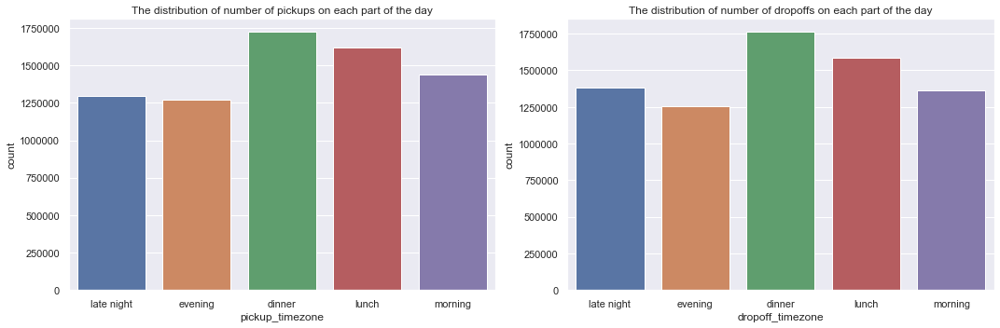

In [28]:
figure,ax=plt.subplots(nrows=1,ncols=2,figsize=(15,5))
sns.countplot(x='pickup_timezone',data=ny_taxi,ax=ax[0])
ax[0].set_title('The distribution of number of pickups on each part of the day')
sns.countplot(x='dropoff_timezone',data=ny_taxi,ax=ax[1])
ax[1].set_title('The distribution of number of dropoffs on each part of the day')
plt.tight_layout()

In [30]:
ny_taxi.head()

,pickup_datetime,dropoff_datetime,PULocationID,DOLocationID,type,pickup_day,dropoff_day,pickup_timezone,dropoff_timezone
0,2019-12-01 00:26:58,2019-12-01 00:41:45,142,116,yellow,Sunday,Sunday,late night,late night
1,2019-12-01 00:12:08,2019-12-01 00:12:14,145,145,yellow,Sunday,Sunday,late night,late night
2,2019-12-01 00:25:53,2019-12-01 00:26:04,145,145,yellow,Sunday,Sunday,late night,late night
3,2019-12-01 00:12:03,2019-12-01 00:33:19,138,25,yellow,Sunday,Sunday,late night,late night
4,2019-12-01 00:05:27,2019-12-01 00:16:32,161,237,yellow,Sunday,Sunday,late night,late night


### We are just interested in those trips that occur at lunch or dinner time

In [32]:
lunch_dinner = ny_taxi[(ny_taxi['dropoff_timezone'] == 'lunch') | (ny_taxi['dropoff_timezone'] == 'dinner')]
lunch_dinner.shape

(3346836, 9)

### Convert categorical variables into dummy variables.

In [41]:
lunch_dinner_dummies = pd.get_dummies(data=lunch_dinner, columns=['dropoff_timezone', 'dropoff_day','type'])
lunch_dinner_dummies.head()

,pickup_datetime,dropoff_datetime,PULocationID,DOLocationID,pickup_day,pickup_timezone,dropoff_timezone_dinner,dropoff_timezone_lunch,dropoff_day_Friday,dropoff_day_Monday,dropoff_day_Saturday,dropoff_day_Sunday,dropoff_day_Thursday,dropoff_day_Tuesday,dropoff_day_Wednesday,type_green,type_yellow
3225,2019-11-30 18:58:04,2019-11-30 19:15:14,79,163,Saturday,dinner,1,0,0,0,1,0,0,0,0,0,1
3578,2019-11-30 19:06:39,2019-11-30 19:23:36,48,158,Saturday,dinner,1,0,0,0,1,0,0,0,0,0,1
3579,2019-11-30 19:27:32,2019-11-30 19:36:31,249,164,Saturday,dinner,1,0,0,0,1,0,0,0,0,0,1
4497,2019-11-30 21:53:01,2019-11-30 21:57:16,161,142,Saturday,dinner,1,0,0,0,1,0,0,0,0,0,1
10255,2019-11-30 18:56:03,2019-11-30 18:59:56,244,116,Saturday,dinner,1,0,0,0,1,0,0,0,0,0,1


### Group records in order to get a record by drop off location

In [42]:
lunch_dinner_grouped = lunch_dinner_dummies.groupby('DOLocationID').agg({
                                                                         'dropoff_timezone_dinner':['sum','count'],
                                                                         'dropoff_timezone_lunch':'sum',
                                                                         'dropoff_day_Monday':'sum',
                                                                         'dropoff_day_Tuesday':'sum',
                                                                         'dropoff_day_Wednesday':'sum',
                                                                         'dropoff_day_Thursday':'sum',
                                                                         'dropoff_day_Friday':'sum',
                                                                         'dropoff_day_Saturday':'sum',
                                                                         'dropoff_day_Sunday':'sum',
                                                                         'type_green':'sum',
                                                                         'type_yellow':'sum'}).reset_index()

lunch_dinner_grouped.columns = ["_".join(x) for x in lunch_dinner_grouped.columns.ravel()]
lunch_dinner_grouped

,DOLocationID_,dropoff_timezone_dinner_sum,dropoff_timezone_dinner_count,dropoff_timezone_lunch_sum,dropoff_day_Monday_sum,dropoff_day_Tuesday_sum,dropoff_day_Wednesday_sum,dropoff_day_Thursday_sum,dropoff_day_Friday_sum,dropoff_day_Saturday_sum,dropoff_day_Sunday_sum,type_green_sum,type_yellow_sum
0,1,2210.0,6786,4576.0,955.0,836.0,889.0,1094.0,987.0,748.0,1277.0,63.0,6723.0
1,2,5.0,11,6.0,2.0,0.0,4.0,0.0,1.0,2.0,2.0,7.0,4.0
2,3,206.0,459,253.0,63.0,97.0,60.0,64.0,66.0,45.0,64.0,245.0,214.0
3,4,9162.0,12820,3658.0,1837.0,1962.0,1579.0,1756.0,2079.0,1823.0,1784.0,162.0,12658.0
4,5,18.0,31,13.0,5.0,7.0,5.0,5.0,6.0,0.0,3.0,0.0,31.0
5,6,27.0,40,13.0,7.0,9.0,3.0,7.0,10.0,1.0,3.0,1.0,39.0
6,7,8705.0,13290,4585.0,2043.0,2204.0,1541.0,1726.0,1806.0,1834.0,2136.0,5211.0,8079.0
7,8,46.0,64,18.0,14.0,10.0,10.0,9.0,7.0,6.0,8.0,21.0,43.0
8,9,226.0,450,224.0,83.0,75.0,54.0,74.0,65.0,46.0,53.0,190.0,260.0
9,10,2475.0,3647,1172.0,616.0,563.0,436.0,501.0,502.0,470.0,559.0,738.0,2909.0


In [43]:
lunch_dinner_grouped.shape

(261, 13)

### Sorting records and see the top 5 with highest amount of drop-off during lunch or dinner time

In [44]:
#list(lunch_dinner_grouped.columns)
#lunch_dinner_grouped.dtypes

lunch_dinner_sorted = lunch_dinner_grouped.sort_values('dropoff_timezone_dinner_count',ascending=False)
lunch_dinner_sorted.head(30)

,DOLocationID_,dropoff_timezone_dinner_sum,dropoff_timezone_dinner_count,dropoff_timezone_lunch_sum,dropoff_day_Monday_sum,dropoff_day_Tuesday_sum,dropoff_day_Wednesday_sum,dropoff_day_Thursday_sum,dropoff_day_Friday_sum,dropoff_day_Saturday_sum,dropoff_day_Sunday_sum,type_green_sum,type_yellow_sum
231,236,69318.0,148592,79274.0,24091.0,25960.0,20055.0,22372.0,20873.0,16887.0,18354.0,3492.0,145100.0
232,237,63369.0,147896,84527.0,22956.0,25709.0,20398.0,22555.0,20874.0,18056.0,17348.0,1425.0,146471.0
157,161,44097.0,113253,69156.0,18879.0,19279.0,13857.0,16915.0,15772.0,14270.0,14281.0,723.0,112530.0
138,142,52985.0,101636,48651.0,14615.0,16199.0,12922.0,13952.0,13721.0,15449.0,14778.0,1335.0,100301.0
225,230,46226.0,100398,54172.0,15588.0,13570.0,12175.0,13459.0,13422.0,14862.0,17322.0,463.0,99935.0
234,239,50285.0,93988,43703.0,14445.0,15983.0,11951.0,13217.0,12906.0,12054.0,13432.0,1941.0,92047.0
166,170,49207.0,93278,44071.0,15177.0,15953.0,12563.0,14048.0,12873.0,10994.0,11670.0,568.0,92710.0
47,48,53561.0,93099,39538.0,13821.0,13727.0,11624.0,12636.0,12213.0,13705.0,15373.0,821.0,92278.0
158,162,39529.0,90826,51297.0,15019.0,14908.0,12430.0,13514.0,13079.0,10991.0,10885.0,567.0,90259.0
137,141,48041.0,85321,37280.0,13174.0,14429.0,11311.0,12173.0,11729.0,10787.0,11718.0,1248.0,84073.0


### Including data of taxi zones in NYC

In [45]:
taxi_zones = gpd.read_file('https://data.cityofnewyork.us/api/geospatial/d3c5-ddgc?method=export&format=GeoJSON')
taxi_zones.head()

#print('GeoJSON file downloaded!')

,shape_area,objectid,shape_leng,location_id,zone,borough,geometry
0,0.0007823067885,1,0.116357453189,1,Newark Airport,EWR,"MULTIPOLYGON (((-74.18445 40.69500, -74.18449 ..."
1,0.00486634037837,2,0.43346966679,2,Jamaica Bay,Queens,"MULTIPOLYGON (((-73.82338 40.63899, -73.82277 ..."
2,0.000314414156821,3,0.0843411059012,3,Allerton/Pelham Gardens,Bronx,"MULTIPOLYGON (((-73.84793 40.87134, -73.84725 ..."
3,0.000111871946192,4,0.0435665270921,4,Alphabet City,Manhattan,"MULTIPOLYGON (((-73.97177 40.72582, -73.97179 ..."
4,0.000497957489363,5,0.0921464898574,5,Arden Heights,Staten Island,"MULTIPOLYGON (((-74.17422 40.56257, -74.17349 ..."


### Rename columns to be able to join both datasets

In [46]:
lunch_dinner_grouped.rename(columns={'DOLocationID_':'location_id'},inplace=True)
lunch_dinner_grouped.head()

,location_id,dropoff_timezone_dinner_sum,dropoff_timezone_dinner_count,dropoff_timezone_lunch_sum,dropoff_day_Monday_sum,dropoff_day_Tuesday_sum,dropoff_day_Wednesday_sum,dropoff_day_Thursday_sum,dropoff_day_Friday_sum,dropoff_day_Saturday_sum,dropoff_day_Sunday_sum,type_green_sum,type_yellow_sum
0,1,2210.0,6786,4576.0,955.0,836.0,889.0,1094.0,987.0,748.0,1277.0,63.0,6723.0
1,2,5.0,11,6.0,2.0,0.0,4.0,0.0,1.0,2.0,2.0,7.0,4.0
2,3,206.0,459,253.0,63.0,97.0,60.0,64.0,66.0,45.0,64.0,245.0,214.0
3,4,9162.0,12820,3658.0,1837.0,1962.0,1579.0,1756.0,2079.0,1823.0,1784.0,162.0,12658.0
4,5,18.0,31,13.0,5.0,7.0,5.0,5.0,6.0,0.0,3.0,0.0,31.0


### Build new dataset by merging the old ones

In [47]:
lunch_dinner_merge = lunch_dinner_grouped[['location_id','dropoff_timezone_dinner_count']]
#lunch_dinner_merge.head()
#taxi_zones.dtypes
taxi_zones['location_id']=taxi_zones['location_id'].astype(int)
taxi_zones_enriched = taxi_zones.merge(lunch_dinner_merge,on="location_id")
taxi_zones_enriched.head()

,shape_area,objectid,shape_leng,location_id,zone,borough,geometry,dropoff_timezone_dinner_count
0,0.0007823067885,1,0.116357453189,1,Newark Airport,EWR,"MULTIPOLYGON (((-74.18445 40.69500, -74.18449 ...",6786
1,0.00486634037837,2,0.43346966679,2,Jamaica Bay,Queens,"MULTIPOLYGON (((-73.82338 40.63899, -73.82277 ...",11
2,0.000314414156821,3,0.0843411059012,3,Allerton/Pelham Gardens,Bronx,"MULTIPOLYGON (((-73.84793 40.87134, -73.84725 ...",459
3,0.000111871946192,4,0.0435665270921,4,Alphabet City,Manhattan,"MULTIPOLYGON (((-73.97177 40.72582, -73.97179 ...",12820
4,0.000497957489363,5,0.0921464898574,5,Arden Heights,Staten Island,"MULTIPOLYGON (((-74.17422 40.56257, -74.17349 ...",31


### Visualization. Create a plain NYC map

In [48]:
nyc_map = folium.Map(location=[40.73, -73.93], zoom_start=10, tiles=None)
folium.TileLayer('CartoDB positron',name="Light Map",control=False).add_to(nyc_map)
nyc_map

### Visualization. Create a choropleth map with the information of number of drop-off during lunch and dinner time

In [49]:
threshold_scale = (lunch_dinner_merge['dropoff_timezone_dinner_count'].quantile((0,0.1,0.75,0.9,0.98,1)))
threshold_scale = threshold_scale.tolist() # change the numpy array to a list
threshold_scale[-1] = threshold_scale[-1] + 1 # make sure that the last value of the list is greater than the maximum immigration

# generate choropleth map using the total immigration of each country to Canada from 1980 to 2013
nyc_map.choropleth(
    geo_data=taxi_zones_enriched,
    data=taxi_zones_enriched,
    columns=['location_id', 'dropoff_timezone_dinner_count'],
    key_on='feature.properties.location_id',
    fill_color='YlOrRd',
    threshold_scale=threshold_scale,
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Lunch-Dinner Drop Off'
)

# display map
nyc_map

### Including centroids of neighborhoods 

In [52]:
centroid_neighborhoods = pd.read_csv('C:/Users/te02881/Downloads/Capstone IBM/centroids_taxi_zones.csv',sep=';')
centroid_neighborhoods.dtypes

OBJECTID_1     int64
OBJECTID       int64
Shape_Leng    object
zone          object
LocationID     int64
borough       object
ORIG_FID       int64
latitude      object
longitude     object
dtype: object

In [53]:
centroid_neighborhoods['latitude'] = centroid_neighborhoods['latitude'].str.replace(',','.')
centroid_neighborhoods['longitude'] = centroid_neighborhoods['longitude'].str.replace(',','.')
centroid_neighborhoods['latitude'] = centroid_neighborhoods['latitude'].astype(float)
centroid_neighborhoods['longitude'] = centroid_neighborhoods['longitude'].astype(float)
centroid_neighborhoods.head()

,OBJECTID_1,OBJECTID,Shape_Leng,zone,LocationID,borough,ORIG_FID,latitude,longitude
0,1,142,"0,038175894232100",Lincoln Square East,142,Manhattan,141,40.773633,-73.981532
1,2,161,"0,035803910061100",Midtown Center,161,Manhattan,160,40.758028,-73.977698
2,3,230,"0,031028309677900",Times Sq/Theatre District,230,Manhattan,229,40.759818,-73.984197
3,4,236,"0,044251922309900",Upper East Side North,236,Manhattan,235,40.780436,-73.957012
4,5,237,"0,042212600338800",Upper East Side South,237,Manhattan,236,40.768615,-73.965635


### Foursquare API. We'll seek restaurants within a radius of 500 meters from the centroids of our top 6 neighborhoods.

In [54]:
import json # library to handle JSON files

import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe


In [55]:
CLIENT_ID = '0Y3WBBZG2ATMDQ2YAV42PORKIDXXYNYUK3BZ0Z01QDVGSQT4' # your Foursquare ID
CLIENT_SECRET = '4WA3GFBOZTZDOJEBYHFCAAGEMDRY2FWL4NI0NVIGWZARPN0X' # your Foursquare Secret
VERSION = '20200821' # Foursquare API version
LIMIT = 190 # limit of number of venues returned by Foursquare API
radius = 500 # define radius
query = 'restaurant'

print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentails:
CLIENT_ID: 0Y3WBBZG2ATMDQ2YAV42PORKIDXXYNYUK3BZ0Z01QDVGSQT4
CLIENT_SECRET:4WA3GFBOZTZDOJEBYHFCAAGEMDRY2FWL4NI0NVIGWZARPN0X


In [56]:
#Function to obtain the restaurants from the top 6 neighborhoods in NYC
def getNearbyVenues(names, latitudes, longitudes, radius=500):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}&query={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT,
            query)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [57]:
#Run the above function on each neighborhood and create a new dataframe
manhattan_restaurants = getNearbyVenues(names=centroid_neighborhoods['zone'],
                                   latitudes=centroid_neighborhoods['latitude'],
                                   longitudes=centroid_neighborhoods['longitude']
                                  )

Lincoln Square East
Midtown Center
Times Sq/Theatre District
Upper East Side North
Upper East Side South
Upper West Side South


In [58]:
#Number of venues returned for each neighborhood
manhattan_restaurants.groupby('Neighborhood').count()

,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
Neighborhood,,,,,,
Lincoln Square East,81,81,81,81,81,81
Midtown Center,59,59,59,59,59,59
Times Sq/Theatre District,100,100,100,100,100,100
Upper East Side North,93,93,93,93,93,93
Upper East Side South,30,30,30,30,30,30
Upper West Side South,100,100,100,100,100,100


In [59]:
manhattan_restaurants.rename(columns={'Venue Latitude':'Venue_Latitude', 'Venue Longitude':'Venue_Longitude'},inplace=True)
manhattan_restaurants.head()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue_Latitude,Venue_Longitude,Venue Category
0,Lincoln Square East,40.773633,-73.981532,The Casbah,40.773750,-73.981767,Food Truck
1,Lincoln Square East,40.773633,-73.981532,Boulud Sud,40.771930,-73.981576,Mediterranean Restaurant
2,Lincoln Square East,40.773633,-73.981532,The Leopard at des Artistes,40.773324,-73.978817,Italian Restaurant
3,Lincoln Square East,40.773633,-73.981532,The Smith,40.771505,-73.982292,American Restaurant
4,Lincoln Square East,40.773633,-73.981532,Breads Bakery,40.771029,-73.981808,Bakery


### Visualization. Create a plain NYC map

In [50]:
nyc_map_final = folium.Map(location=[40.75, -73.99], zoom_start=12, tiles=None)
folium.TileLayer('CartoDB positron',name="Light Map",control=False).add_to(nyc_map_final)
nyc_map_final

## Create a map with all the information, neighborhoods by drop off density and restaurants located within them. Those will be the target of our advertising campaign

In [60]:
# generate marker map

restaurants = folium.map.FeatureGroup()

for lat, lng, in zip(manhattan_restaurants.Venue_Latitude, manhattan_restaurants.Venue_Longitude):
    restaurants.add_child(
        folium.features.CircleMarker(
            [lat, lng],
            radius=2, # define how big you want the circle markers to be
            color='#3186cc',
            fill=True,
            fill_color='#3186cc',
            #fill_opacity=0.8
        )
    )

nyc_map_final.add_child(restaurants)

threshold_scale = (lunch_dinner_merge['dropoff_timezone_dinner_count'].quantile((0,0.1,0.75,0.9,0.98,1)))
threshold_scale = threshold_scale.tolist() # change the numpy array to a list
threshold_scale[-1] = threshold_scale[-1] + 1 # make sure that the last value of the list is greater than the maximum

# generate choropleth map 
nyc_map_final.choropleth(
    geo_data=taxi_zones_enriched,
    data=taxi_zones_enriched,
    columns=['location_id', 'dropoff_timezone_dinner_count'],
    key_on='feature.properties.location_id',
    fill_color='YlOrRd',
    threshold_scale=threshold_scale,
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Lunch-Dinner Drop Off'
)

# display map
nyc_map_final